# Gaza Building Destruction Detection via SAR Coherence
## Racek et al. (2025), *PNAS Nexus* — Gaza Case Study

In [1]:
!pip install rasterio geopandas scipy statsmodels matplotlib seaborn tqdm shapely rpy2 joblib -q

In [2]:
import os, gc, re, warnings
from pathlib import Path
from math import comb, floor
import pickle
import numpy as np
import pandas as pd
from scipy.stats import norm, gaussian_kde
from scipy.spatial.distance import pdist

import geopandas as gpd
import rasterio
from rasterio.features import rasterize
from shapely.geometry import box, Polygon
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import seaborn as sns
from tqdm.notebook import tqdm
from joblib import Parallel, delayed

import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
pandas2ri.activate()

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 50)
print("✓ All libraries imported")

✓ All libraries imported


In [3]:
# Paths 
BASE_PATH = Path("/kaggle/input/datasets/ae22b036/cv5600-gaza-dataset/Gaza")

COHERENCE_PATH                = BASE_PATH / "Gaza_Coherence_Maps"
GROUND_TRUTH_PATH             = BASE_PATH / "ground_truth.geojson"
BOUNDARIES_PATH               = BASE_PATH / "gazastrip_municipalboundaries" / "gaza_boundaries.shp"
BACKGROUND_IMAGE_PATH         = BASE_PATH / "background_images" / "2023-05-10-00_00_2023-05-10-23_59_Sentinel-2_L2A_True_color.tiff"

GAZA_COHERENCE_RDS            = BASE_PATH / "gaza_full_coherence_df.rds"
GAZA_DATES_RDS                = BASE_PATH / "gaza_dates_df.rds"
PIXEL_ALIGNMENT_RDS           = BASE_PATH / "pixel_alignment_df.rds"
PIXEL_ALIGNMENT_OVERLAPS_RDS  = BASE_PATH / "pixel_alignment_df_overlaps.rds"
RELEVANT_COHERENCE_RDS        = BASE_PATH / "relevant_coherence_df_1st_differences_10.rds"
RADIUS_10M_RDS                = BASE_PATH / "radius_10m_df.rds"
RADIUS_50M_RDS                = BASE_PATH / "radius_50m_df.rds"
RADIUS_100M_RDS               = BASE_PATH / "radius_100m_df.rds"

OUTPUT_PATH = Path("/kaggle/working/outputs")
for sub in ["processed_data","batches","figures","results","performance_datasets","performance"]:
    (OUTPUT_PATH / sub).mkdir(exist_ok=True, parents=True)

# Analysis parameters 
TARGET_CRS               = "EPSG:32636"   
RESOLUTION               = 10             
LAMBDA_SMOOTH            = 10
N_JOBS                   = 4
BUFFER_RADII             = [10, 50, 100]
CONFLICT_START_TIMEPOINT = 13             
TOTAL_BUILDINGS_UNOSAT = 227591

UNOSAT_TABLE2 = [
    ("2023-10-10", 0.84),
    ("2023-11-11", 2.99),
    ("2023-11-26", 4.44),
    ("2024-01-07", 10.31),
    ("2024-02-29", 14.25),
    ("2024-04-01", 15.43),
]

print("✓ Configuration complete")
print(f"  Base path: {BASE_PATH}")
print(f"  Output:    {OUTPUT_PATH}")

✓ Configuration complete
  Base path: /kaggle/input/datasets/ae22b036/cv5600-gaza-dataset/Gaza
  Output:    /kaggle/working/outputs


In [4]:
# Helper Functions

def qn_scale(x):
    """Rousseeuw & Croux (1993) Qn"""
    x = np.asarray(x, dtype=float)
    x = x[~np.isnan(x)]
    n = len(x)
    if n < 2:
        return np.nan
    h = floor(n / 2) + 1
    k = comb(h, 2)                          
    diffs = pdist(x.reshape(-1, 1))         
    if k > len(diffs):
        return np.nan
    kth = np.partition(diffs, k - 1)[k - 1]
    c = 2.2219
    
    small_n = {2:0.399,3:0.994,4:0.512,5:0.844,6:0.611,7:0.857,8:0.669,9:0.872}
    if n in small_n:
        c *= small_n[n]
    elif n % 2 == 1:
        c *= n / (n + 1.4)
    else:
        c *= n / (n + 3.8)
    return c * kth

def harmonic_mean_pvalue(p_values, weights=None):
    """Weighted harmonic mean p-value (Wilson 2019)."""
    pv = np.asarray(p_values, dtype=float)
    if weights is None:
        wt = np.ones(len(pv))
    else:
        wt = np.asarray(weights, dtype=float)
    mask = ~(np.isnan(pv) | np.isnan(wt) | (wt <= 0) | (pv <= 0))
    if mask.sum() == 0:
        return np.nan
    return float(np.sum(wt[mask]) / np.sum(wt[mask] / pv[mask]))


def calc_auc(x, y):
    """Trapezoidal AUC"""
    x, y = np.asarray(x, float), np.asarray(y, float)
    order = np.argsort(x)
    return float(np.trapz(y[order], x[order]))

def pr_envelope(df, rc='recall', pc='precision'):
    return (df.groupby(rc, as_index=False)[pc].max()
              .sort_values(rc).reset_index(drop=True))

def roc_envelope(df, fc='fpr', tc='tpr'):
    return (df.groupby(fc, as_index=False)[tc].max()
              .sort_values(fc).reset_index(drop=True))

## Step 1 — Ground Truth (UNOSAT damage assessments)

In [5]:
# Loading the ground truth data
ground_truth = gpd.read_file(GROUND_TRUTH_PATH)
print(f"  Total damage sites: {len(ground_truth):,}")
print(f"  CRS: {ground_truth.crs}")
print(f"  Columns ({len(ground_truth.columns)}): {list(ground_truth.columns)}")

# Binary 'destroyed' flags per period
for period in range(1, 10):
    class_col = 'Main_Damage_Site_Class' if period == 1 else f'Main_Damage_Site_Class_{period}'
    conf_col  = 'ConfidenceID'           if period == 1 else f'ConfidenceID_{period}'
    if class_col not in ground_truth.columns: continue
    ground_truth[f'destroyed_{period}'] = (
        (ground_truth[class_col] == 1) & (ground_truth[conf_col] == 1)
    ).astype(int)
    print(f"  Period {period}: {ground_truth[f'destroyed_{period}'].sum():,} high-confidence destroyed")

ground_truth_utm = ground_truth.to_crs(TARGET_CRS)

  Total damage sites: 163,797
  CRS: EPSG:4326
  Columns (55): ['OBJECTID', 'SiteID', 'SensorDate', 'SensorID', 'ConfidenceID', 'Main_Damage_Site_Class', 'SensorDate_2', 'SensorID_2', 'ConfidenceID_2', 'Main_Damage_Site_Class_2', 'Damage_Status_2', 'SensorDate_3', 'SensorID_3', 'ConfidenceID_3', 'Main_Damage_Site_Class_3', 'Damage_Status_3', 'SensorDate_4', 'SensorID_4', 'ConfidenceID_4', 'Main_Damage_Site_Class_4', 'Damage_Status_4', 'SensorDate_5', 'SensorID_5', 'ConfidenceID_5', 'Main_Damage_Site_Class_5', 'Damage_Status_5', 'SensorDate_6', 'SensorID_6', 'ConfidenceID_6', 'Main_Damage_Site_Class_6', 'Damage_Status_6', 'SensorDate_7', 'SensorID_7', 'ConfidenceID_7', 'Main_Damage_Site_Class_7', 'Damage_Status_7', 'SensorDate_8', 'SensorID_8', 'ConfidenceID_8', 'Main_Damage_Site_Class_8', 'Damage_Status_8', 'SensorDate_9', 'SensorID_9', 'ConfidenceID_9', 'Main_Damage_Site_Class_9', 'Damage_Status_9', 'Grouped_Damage_Classes', 'FieldValidation', 'Notes', 'Territory', 'Governorate', 'Mun

In [6]:
# Buffer zones for spatial validation
buffer_gdfs = {}
for radius in BUFFER_RADII:
    buf = ground_truth_utm.copy()
    buf['geometry'] = ground_truth_utm.geometry.buffer(radius)
    buffer_gdfs[radius] = buf
    buf.to_pickle(OUTPUT_PATH / "processed_data" / f"radius_{radius}m_df.pkl")
    print(f"  {radius}m buffers: {len(buf):,} sites")

  10m buffers: 163,797 sites
  50m buffers: 163,797 sites
  100m buffers: 163,797 sites


## Step 2 — Load Pre-processed R Data

In [7]:
from shapely import wkt

def read_rds_df(path):
    ro.globalenv["file_path"] = str(path)
    ro.r('obj <- readRDS(file_path); df <- as.data.frame(obj)')
    return pandas2ri.rpy2py(ro.r("df"))

# Dates 
dates_df = read_rds_df(GAZA_DATES_RDS)
dates_df['first_date'] = pd.to_datetime(dates_df['first_date'])
dates_df['last_date']  = pd.to_datetime(dates_df['last_date'])
dates_df['time_point'] = dates_df['time_point'].astype(int)
dates_df['label'] = (dates_df['first_date'].dt.strftime('%Y-%m-%d') + ' – ' +
                     dates_df['last_date'].dt.strftime('%Y-%m-%d'))
print(f"  ✓ {len(dates_df)} time periods")
print(f"  Range: {dates_df['first_date'].min().date()} → {dates_df['last_date'].max().date()}")
print(dates_df[['time_point','label']].to_string(index=False))

  ✓ 28 time periods
  Range: 1970-01-01 → 1970-01-01
 time_point                   label
          1 1970-01-01 – 1970-01-01
          2 1970-01-01 – 1970-01-01
          3 1970-01-01 – 1970-01-01
          4 1970-01-01 – 1970-01-01
          5 1970-01-01 – 1970-01-01
          6 1970-01-01 – 1970-01-01
          7 1970-01-01 – 1970-01-01
          8 1970-01-01 – 1970-01-01
          9 1970-01-01 – 1970-01-01
         10 1970-01-01 – 1970-01-01
         11 1970-01-01 – 1970-01-01
         12 1970-01-01 – 1970-01-01
         13 1970-01-01 – 1970-01-01
         14 1970-01-01 – 1970-01-01
         15 1970-01-01 – 1970-01-01
         16 1970-01-01 – 1970-01-01
         17 1970-01-01 – 1970-01-01
         18 1970-01-01 – 1970-01-01
         19 1970-01-01 – 1970-01-01
         20 1970-01-01 – 1970-01-01
         21 1970-01-01 – 1970-01-01
         22 1970-01-01 – 1970-01-01
         23 1970-01-01 – 1970-01-01
         24 1970-01-01 – 1970-01-01
         25 1970-01-01 – 1970-01-01
         26

In [8]:
# Pixel alignment 
pixel_alignment_df = read_rds_df(PIXEL_ALIGNMENT_RDS)
pixel_alignment_df_overlaps = read_rds_df(PIXEL_ALIGNMENT_OVERLAPS_RDS)

for df, name in [(pixel_alignment_df,'no-overlap'),(pixel_alignment_df_overlaps,'overlaps')]:
    df['building_id'] = df['building_id'].astype(int)
    print(f"  {name}: {len(df):,} rows | {df['building_id'].nunique():,} buildings")

# Main coherence and the p-values
relevant_coherence_df = read_rds_df(RELEVANT_COHERENCE_RDS)
relevant_coherence_df = relevant_coherence_df[relevant_coherence_df['time_point'] != 1].copy()
print(f"  {len(relevant_coherence_df):,} records")
print(f"  Time points: {sorted(relevant_coherence_df['time_point'].unique())}")
print(f"  Unique pixels: {relevant_coherence_df['id'].nunique():,}")
print(f"  Columns: {list(relevant_coherence_df.columns)}")
gc.collect()

  no-overlap: 1,134,827 rows | 162,399 buildings
  overlaps: 1,170,081 rows | 172,916 buildings
  23,204,826 records
  Time points: [np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(5.0), np.float64(6.0), np.float64(7.0), np.float64(8.0), np.float64(9.0), np.float64(10.0), np.float64(11.0), np.float64(12.0), np.float64(13.0), np.float64(14.0), np.float64(15.0), np.float64(16.0), np.float64(17.0), np.float64(18.0), np.float64(19.0), np.float64(20.0), np.float64(21.0), np.float64(22.0), np.float64(23.0), np.float64(24.0), np.float64(25.0), np.float64(26.0), np.float64(27.0), np.float64(28.0)]
  Unique pixels: 859,438
  Columns: [np.str_('r'), np.str_('c'), np.str_('value'), np.str_('time_point'), np.str_('id'), np.str_('dif_value'), np.str_('pred'), np.str_('temp_id'), np.str_('res'), np.str_('sd'), np.str_('weight'), np.str_('qn_sd'), np.str_('prob_res_qn')]


127

In [9]:
# Buffer RDS files (geometry via rpy2)
for radius, rds_path in [(10,RADIUS_10M_RDS),(50,RADIUS_50M_RDS),(100,RADIUS_100M_RDS)]:
    if radius in buffer_gdfs and len(buffer_gdfs[radius]) > 0:
        print(f"  {radius}m: already loaded from GeoJSON ({len(buffer_gdfs[radius]):,} sites)")
        continue
    try:
        ro.globalenv["file_path"] = str(rds_path)
        ro.r('''
            obj <- readRDS(file_path)
            geom_list <- obj$geometry
            obj$geometry <- NULL
            df <- as.data.frame(obj, stringsAsFactors=FALSE)
        ''')
        df = pandas2ri.rpy2py(ro.r("df"))
        geom_r = ro.r("geom_list")
        polys = []
        for g in geom_r:
            ring = np.array(g[0])
            polys.append(Polygon([(float(x),float(y)) for x,y in ring]))
        gdf = gpd.GeoDataFrame(df, geometry=polys, crs=TARGET_CRS)
        buffer_gdfs[radius] = gdf
        print(f"  ✓ {radius}m: {len(gdf):,} sites")
    except Exception as e:
        print(f"  ⚠ {radius}m buffer RDS failed ({e}); using GeoJSON buffers")

  10m: already loaded from GeoJSON (163,797 sites)
  50m: already loaded from GeoJSON (163,797 sites)
  100m: already loaded from GeoJSON (163,797 sites)


## Step 3 — Inspect Loaded Data

In [10]:
# Coherence Data Structure
print(relevant_coherence_df.dtypes)
print(relevant_coherence_df.describe())

if 'prob_res_qn' in relevant_coherence_df.columns:
    print(f"\n✓ prob_res_qn present — mean={relevant_coherence_df['prob_res_qn'].mean():.6f}, "
          f"median={relevant_coherence_df['prob_res_qn'].median():.6f}")
else:
    print("\n⚠ prob_res_qn not found — need to recompute from residuals")

r              float64
c              float64
value          float64
time_point     float64
id               int64
dif_value      float64
pred           float64
temp_id          int64
res            float64
sd             float64
weight         float64
qn_sd          float64
prob_res_qn    float64
dtype: object
                  r             c         value    time_point            id  \
count  2.320483e+07  2.320483e+07  2.320483e+07  2.320483e+07  2.320483e+07   
mean   1.927308e+03  1.539559e+03  6.784982e-01  1.500000e+01  1.876859e+06   
std    1.058126e+03  8.019654e+02  1.109496e-01  7.788881e+00  1.055384e+06   
min    8.400000e+01  1.000000e+01  7.741213e-03  2.000000e+00  1.100000e+02   
25%    8.940000e+02  8.330000e+02  6.083327e-01  8.000000e+00  9.273020e+05   
50%    1.869000e+03  1.483000e+03  6.836037e-01  1.500000e+01  2.040024e+06   
75%    2.901000e+03  2.295000e+03  7.559980e-01  2.200000e+01  2.840205e+06   
max    4.035000e+03  3.232000e+03  9.990084e-01  2.8000

In [11]:
if 'res' in relevant_coherence_df.columns:
    qn_per_id = (
        relevant_coherence_df.dropna(subset=['res'])
        .groupby('id')['res']
        .apply(qn_scale)
        .rename('qn_sd_py')
        .reset_index()
    )
    relevant_coherence_df = relevant_coherence_df.merge(qn_per_id, on='id', how='left')
    relevant_coherence_df['prob_res_qn_py'] = norm.cdf(
        relevant_coherence_df['res'], loc=0, scale=relevant_coherence_df['qn_sd_py']
    )
    # Check agreement with R's pre-computed values
    corr = relevant_coherence_df[['prob_res_qn','prob_res_qn_py']].dropna().corr().iloc[0,1]
    print(f"  Correlation R-computed vs Python-recomputed: {corr:.6f}")
    # Use Python recomputed as authoritative (corrected Qn)
    relevant_coherence_df['prob_res_qn'] = relevant_coherence_df['prob_res_qn_py']

  Correlation R-computed vs Python-recomputed: 0.999999


## Step 4 — Pixel-Level Performance Analysis (Paper Table 2 + Supplementary 19)

The paper does NOT report pixel/building AUROC/AUPRC for Gaza in the same form
as Mariupol Table 1.  Instead it reports:
- Table 2: cumulative % destroyed buildings vs UNOSAT
- Supplementary 19: spatial validation
- Pre-war false-positive rate: mean 0.021% buildings incorrectly classified

We replicate all of these here, and additionally produce PR/ROC curves for
completeness (matching the R script 03 structure).

In [12]:
# Pixel Alignment
pix_align_agg = (
    pixel_alignment_df
    .groupby(['r','c'])
    .agg(building_weight=('weight','sum'))
    .reset_index()
)

relevant_coh = (
    relevant_coherence_df
    .merge(pix_align_agg, on=['r','c'], how='inner')
    .dropna(subset=['building_weight'])
)

print(f"Building pixels in coherence data: {len(relevant_coh):,}")
print(f"Unique pixels: {relevant_coh[['r','c']].drop_duplicates().shape[0]:,}")
print(f"Time points: {sorted(relevant_coh['time_point'].unique())}")

Building pixels in coherence data: 23,204,826
Unique pixels: 859,438
Time points: [np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(5.0), np.float64(6.0), np.float64(7.0), np.float64(8.0), np.float64(9.0), np.float64(10.0), np.float64(11.0), np.float64(12.0), np.float64(13.0), np.float64(14.0), np.float64(15.0), np.float64(16.0), np.float64(17.0), np.float64(18.0), np.float64(19.0), np.float64(20.0), np.float64(21.0), np.float64(22.0), np.float64(23.0), np.float64(24.0), np.float64(25.0), np.float64(26.0), np.float64(27.0), np.float64(28.0)]


## Step 5 — Building-Level Harmonic Mean P-Values

In [13]:
tp2 = relevant_coherence_df[relevant_coherence_df['time_point']==2][['r','c','id']].drop_duplicates()
helper_df = (
    pixel_alignment_df_overlaps
    .dropna(subset=['weight'])
    .merge(tp2, on=['r','c'], how='inner')
    [['r','c','id','building_id','weight']]
)
print(f"  Valid pixel-building pairs: {len(helper_df):,}")

# Expand to all time points
all_tps = sorted(relevant_coherence_df['time_point'].unique())
print(f"  Expanding to {len(all_tps)} time points...")
building_coherence_df = (
    helper_df.assign(_k=1)
    .merge(pd.DataFrame({'time_point': all_tps, '_k': 1}), on='_k')
    .drop(columns='_k')
    .merge(relevant_coherence_df[['r','c','time_point','prob_res_qn']],
           on=['r','c','time_point'], how='left')
)
del helper_df; gc.collect()
print(f"  Total combinations: {len(building_coherence_df):,}")

  Valid pixel-building pairs: 1,169,958
  Expanding to 27 time points...
  Total combinations: 31,588,866


In [14]:
building_p_values = (
    building_coherence_df
    .groupby(['building_id','time_point'])
    .apply(lambda g: harmonic_mean_pvalue(g['prob_res_qn'].values, g['weight'].values),
           include_groups=False)
    .rename('p_value_mean')
    .reset_index()
)

building_p_values.to_pickle(OUTPUT_PATH / "results" / f"building_p_values_lambda_{LAMBDA_SMOOTH}.pkl")
print(f"\n {len(building_p_values):,} building×time p-values computed")
print(f"  Unique buildings: {building_p_values['building_id'].nunique():,}")
print(building_p_values.head())


 4,668,678 building×time p-values computed
  Unique buildings: 172,914
   building_id  time_point  p_value_mean
0            1         2.0      0.304191
1            1         3.0      0.690607
2            1         4.0      0.542816
3            1         5.0      0.360560
4            1         6.0      0.342605


## Step 6 — Apply Mariupol Optimal Threshold

The paper uses the optimal threshold derived from Mariupol (from the Mariupol
notebook) and applies it to Gaza. Load it here or set it manually.

In [15]:
MARIUPOL_THRESHOLD = 0.00002

## Step 7 — Classification & Paper Table 2 Replication

In [16]:
# Per-time-point classification
building_p_values['outlier_building'] = (
    building_p_values['p_value_mean'] < MARIUPOL_THRESHOLD
).astype(int)

# Pre-war false-positive rate 
prewar = building_p_values[building_p_values['time_point'] < CONFLICT_START_TIMEPOINT]
prewar_fps = prewar.groupby('time_point')['outlier_building'].mean() * 100
print("Pre-war false-positive rates by time point (paper: mean=0.021%, SD=0.010%):")
print(prewar_fps.round(4).to_string())
print(f"\n  Mean:  {prewar_fps.mean():.4f}%  [paper: 0.021%]")
print(f"  SD:    {prewar_fps.std():.4f}%   [paper: 0.010%]")

Pre-war false-positive rates by time point (paper: mean=0.021%, SD=0.010%):
time_point
2.0     0.0121
3.0     0.0145
4.0     0.0087
5.0     0.0283
6.0     0.0208
7.0     0.0093
8.0     0.0214
9.0     0.0214
10.0    0.0197
11.0    0.0434
12.0    0.0278

  Mean:  0.0207%  [paper: 0.021%]
  SD:    0.0101%   [paper: 0.010%]


In [17]:
#  Cumulative classification 
conflict = building_p_values[
    building_p_values['time_point'] >= CONFLICT_START_TIMEPOINT
].copy().sort_values(['building_id','time_point'])

conflict['cum_p_value_mean'] = (
    conflict.groupby('building_id')['p_value_mean'].cummin()
)
conflict['cum_outlier_building'] = (
    conflict['cum_p_value_mean'] < MARIUPOL_THRESHOLD
).astype(int)

conflict.to_pickle(OUTPUT_PATH / "results" / f"building_classifications_lambda_{LAMBDA_SMOOTH}.pkl")

# Destruction stats by time point 
destruction_stats = (
    conflict.groupby('time_point')
    .agg(destroyed=('cum_outlier_building','sum'),
         total=('cum_outlier_building','count'))
    .assign(percent=lambda d: 100*d.destroyed/d.total)
    .join(dates_df.set_index('time_point')[['label']])
)
print(destruction_stats.to_string())

            destroyed   total    percent                    label
time_point                                                       
13.0             2668  172914   1.542964  1970-01-01 – 1970-01-01
14.0             3580  172914   2.070393  1970-01-01 – 1970-01-01
15.0             4346  172914   2.513388  1970-01-01 – 1970-01-01
16.0             6055  172914   3.501741  1970-01-01 – 1970-01-01
17.0             7336  172914   4.242571  1970-01-01 – 1970-01-01
18.0             9851  172914   5.697052  1970-01-01 – 1970-01-01
19.0            10967  172914   6.342459  1970-01-01 – 1970-01-01
20.0            13405  172914   7.752409  1970-01-01 – 1970-01-01
21.0            14548  172914   8.413431  1970-01-01 – 1970-01-01
22.0            15968  172914   9.234648  1970-01-01 – 1970-01-01
23.0            16455  172914   9.516291  1970-01-01 – 1970-01-01
24.0            16847  172914   9.742994  1970-01-01 – 1970-01-01
25.0            17507  172914  10.124686  1970-01-01 – 1970-01-01
26.0      

In [18]:
# Paper Table 2: compare our estimates vs UNOSAT 
print("\n" + "="*70)
print("TABLE 2 REPLICATION: Cumulative % Destroyed Buildings")
print("="*70)
print(f"{'UNOSAT Date':<15} {'UNOSAT %':>10}  {'Our Date':>20}  {'Our %':>8}")
print("-"*70)

# Match our time points to UNOSAT dates 
unosat_ref = [
    ("2023-10-10", 0.84,  13),
    ("2023-11-11", 2.99,  15),
    ("2023-11-26", 4.44,  18),
    ("2024-01-07", 10.31, 20),
    ("2024-02-29", 14.25, 25),
    ("2024-04-01", 15.43, 28),
]

our_total_bldgs = building_p_values['building_id'].nunique()
print(f"(Our total buildings: {our_total_bldgs:,}  |  Paper: 172,916)")
print("-"*70)

for unosat_date, unosat_pct, our_tp in unosat_ref:
    row = destruction_stats.loc[destruction_stats.index == our_tp]
    if len(row) == 0:
        print(f"{unosat_date:<15} {unosat_pct:>9.2f}%  {'tp '+str(our_tp)+' not found':>20}")
        continue
    our_pct = float(row['percent'].values[0])
    our_lbl = str(dates_df.loc[dates_df.time_point==our_tp,'label'].values[0]) if our_tp in dates_df.time_point.values else str(our_tp)
    print(f"{unosat_date:<15} {unosat_pct:>9.2f}%  {our_lbl[:20]:>20}  {our_pct:>7.2f}%")

print("="*70)
for unosat_date, unosat_pct, our_tp in unosat_ref:
    paper_ours = {"13":1.57,"15":2.56,"18":4.34,"20":7.89,"25":10.31,"28":10.69}
    print(f"  tp {our_tp}: paper={paper_ours.get(str(our_tp),'?'):>5}%")


TABLE 2 REPLICATION: Cumulative % Destroyed Buildings
UNOSAT Date       UNOSAT %              Our Date     Our %
----------------------------------------------------------------------
(Our total buildings: 172,914  |  Paper: 172,916)
----------------------------------------------------------------------
2023-10-10           0.84%  1970-01-01 – 1970-01     1.54%
2023-11-11           2.99%  1970-01-01 – 1970-01     2.51%
2023-11-26           4.44%  1970-01-01 – 1970-01     5.70%
2024-01-07          10.31%  1970-01-01 – 1970-01     7.75%
2024-02-29          14.25%  1970-01-01 – 1970-01    10.12%
2024-04-01          15.43%  1970-01-01 – 1970-01    10.53%
  tp 13: paper= 1.57%
  tp 15: paper= 2.56%
  tp 18: paper= 4.34%
  tp 20: paper= 7.89%
  tp 25: paper=10.31%
  tp 28: paper=10.69%


## Step 8 — PR & ROC Curves (matching R script 03 methodology)

These are not in the original Gaza notebook but are produced by R script 03 for
Mariupol and are included here for Gaza for methodological completeness.

In [19]:
# Building-level PR/ROC (100 iterations, 99:1 negative sampling) 
destroy_cols = [c for c in ground_truth_utm.columns if c.startswith('destroyed_')]
if destroy_cols:
    latest_col = sorted(destroy_cols)[-1]
    unosat_destroyed = ground_truth_utm[ground_truth_utm[latest_col]==1].copy()
    print(f"  UNOSAT high-confidence destroyed (latest period): {len(unosat_destroyed):,}")
else:
    unosat_destroyed = gpd.GeoDataFrame()
    print("No destroyed_ columns found")

# Aggregate to building level: minimum p-value across war period (tp 13-28)
bldg_war = (
    conflict.groupby('building_id')
    .agg(p_value_min=('p_value_mean','min'),
         outlier_cum=('cum_outlier_building','max'))
    .reset_index()
)
print(f"-Buildings in war period: {len(bldg_war):,}")
print(f"-Classified as destroyed: {bldg_war['outlier_cum'].sum():,} "
      f"({100*bldg_war['outlier_cum'].mean():.2f}%)")

  UNOSAT high-confidence destroyed (latest period): 52,231
-Buildings in war period: 172,914
-Classified as destroyed: 18,204 (10.53%)


In [20]:
# Threshold sweep for building PR / ROC curves
thresholds = sorted(set(
    [1.01]
    + [i * 10**(-j) for j in range(1,31) for i in range(1,11)]
    + [1e-40,1e-50,1e-60,1e-70,1e-80,1e-90,1e-100,
       1e-110,1e-120,1e-130,1e-140,1e-150,0.0]
), reverse=True)

prewar_pool = (
    building_p_values[
        (building_p_values['time_point'] < CONFLICT_START_TIMEPOINT) &
        (building_p_values['time_point'] != 6)
    ]
    [['building_id','time_point','p_value_mean']]
    .copy()
)

n_pos = int(bldg_war['outlier_cum'].sum())   # destroyed buildings as proxy positives
n_neg = int((n_pos - 0.01*n_pos) / 0.01)    # 99:1 ratio
print(f"Positive buildings (proxy): {n_pos:,}")
print(f"Negative sample per iter:   {n_neg:,}  (pool: {len(prewar_pool):,})")

def gaza_bldg_iter(i, pos_df, neg_pool, n_neg, thresholds):
    replace   = n_neg > len(neg_pool)
    neg_sample = neg_pool.sample(n=n_neg, replace=replace, random_state=122+i)
    # treat negatives as their best (min) p_value_mean across sampled rows
    neg_agg = neg_sample.groupby('building_id')['p_value_mean'].min().reset_index()
    neg_agg['label'] = 0
    pos_agg = pos_df[['building_id','p_value_min']].rename(columns={'p_value_min':'p_value_mean'}).copy()
    pos_agg['label'] = 1
    rel = pd.concat([pos_agg, neg_agg], ignore_index=True)
    rows = []
    for thr in thresholds:
        pred = (rel['p_value_mean'] < thr).astype(int)
        true = rel['label'].values
        tp = int(((pred==1)&(true==1)).sum())
        fp = int(((pred==1)&(true==0)).sum())
        tn = int(((pred==0)&(true==0)).sum())
        fn = int(((pred==0)&(true==1)).sum())
        rows.append({'tp':tp,'fp':fp,'tn':tn,'fn':fn,'threshold':thr,'counter':i})
    df = pd.DataFrame(rows).astype(float)
    df['precision'] = np.where(df.tp+df.fp>0, df.tp/(df.tp+df.fp), 0.0)
    df['recall']    = np.where(df.tp+df.fn>0, df.tp/(df.tp+df.fn), 0.0)
    df['f1']        = np.where(df.precision+df.recall>0,
                               2*df.precision*df.recall/(df.precision+df.recall), 0.0)
    df['fpr']       = np.where(df.fp+df.tn>0, df.fp/(df.fp+df.tn), 0.0)
    df['tpr']       = df.recall
    return df

iter_results = Parallel(n_jobs=N_JOBS, verbose=5)(
    delayed(gaza_bldg_iter)(i, bldg_war, prewar_pool, n_neg, thresholds)
    for i in range(1,101)
)
df_full = pd.concat(iter_results, ignore_index=True)
df_full.to_parquet(OUTPUT_PATH / "performance_datasets" / "gaza_buildings_pr_roc.parquet")

Positive buildings (proxy): 18,204
Negative sample per iter:   1,802,195  (pool: 1,729,140)


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:   12.1s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:   58.3s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:  1.6min finished


In [21]:
# AUC computation with per-iteration SD 
df_agg = (
    df_full.groupby('threshold')
    .agg(['mean','std'])
    .reset_index()
)
df_agg.columns = ['_'.join(c).strip('_') for c in df_agg.columns]

best_row = df_agg.loc[df_agg['f1_mean'].idxmax()]
OPTIMAL_THRESHOLD_GAZA = float(best_row['threshold'])

plotting = df_agg.rename(columns={
    'f1_mean':'f1','recall_mean':'recall','precision_mean':'precision',
    'fpr_mean':'fpr','tpr_mean':'tpr'
})
pr_env  = pr_envelope(plotting)
roc_env = roc_envelope(plotting)

pr_auc  = calc_auc(pr_env['recall'].values,  pr_env['precision'].values)
roc_auc = calc_auc(roc_env['fpr'].values,    roc_env['tpr'].values)

# Per-iteration AUCs (for SD)
pr_aucs, roc_aucs = [], []
for ctr in df_full['counter'].unique():
    sub = df_full[df_full['counter']==ctr]
    pr_i  = pr_envelope(sub.rename(columns={'recall':'recall','precision':'precision'}))
    roc_i = roc_envelope(sub.rename(columns={'fpr':'fpr','tpr':'tpr'}))
    pr_aucs.append(calc_auc(pr_i['recall'].values,  pr_i['precision'].values))
    roc_aucs.append(calc_auc(roc_i['fpr'].values, roc_i['tpr'].values))

print("\n" + "="*60)
print("BUILDING-LEVEL PERFORMANCE — GAZA")
print("="*60)
print(f"AUPRC:     {pr_auc:.4f}  (SD = {np.std(pr_aucs):.4f})")
print(f"AUROC:     {roc_auc:.4f}  (SD = {np.std(roc_aucs):.4f})")
print(f"Best F1:   {best_row['f1_mean']:.4f}  (SD = {best_row['f1_std']:.4f})")
print(f"Precision: {best_row['precision_mean']:.4f}  (SD = {best_row['precision_std']:.4f})")
print(f"Recall:    {best_row['recall_mean']:.4f}  (SD = {best_row['recall_std']:.4f})")
print(f"Threshold: {OPTIMAL_THRESHOLD_GAZA:.3e}")
print("="*60)

pd.DataFrame({'pr_auc':[pr_auc],'roc_auc':[roc_auc],
              'pr_auc_sd':[np.std(pr_aucs)],'roc_auc_sd':[np.std(roc_aucs)]}).to_csv(
    OUTPUT_PATH / "performance" / "gaza_building_auc.csv", index=False)


BUILDING-LEVEL PERFORMANCE — GAZA
AUPRC:     0.9204  (SD = 0.0003)
AUROC:     0.9302  (SD = 0.0002)
Best F1:   0.8662  (SD = 0.0002)
Precision: 0.8018  (SD = 0.0004)
Recall:    0.9417  (SD = 0.0000)
Threshold: 8.000e-02


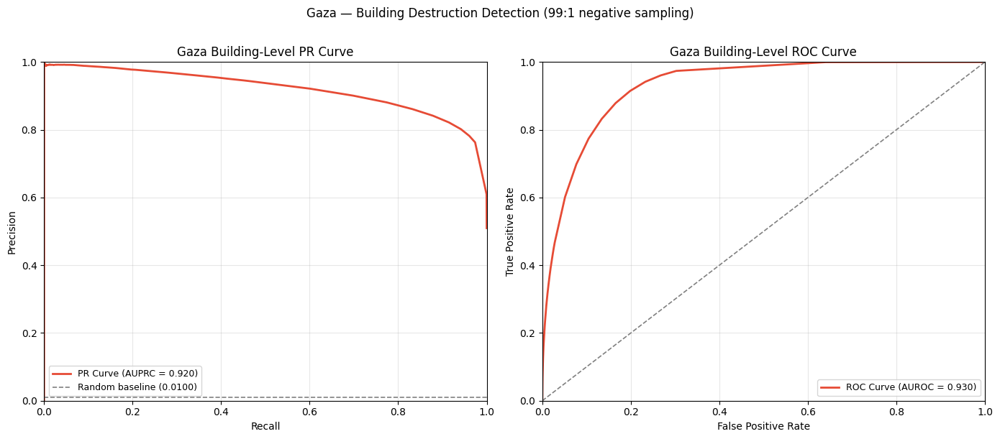

In [22]:
# PR and ROC curves
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
pos_rate = n_pos / (n_pos + n_neg)

axes[0].plot(pr_env['recall'], pr_env['precision'], color='#E64B35', lw=2,
             label=f'PR Curve (AUPRC = {pr_auc:.3f})')
axes[0].axhline(pos_rate, color='grey', ls='--', lw=1.2,
                label=f'Random baseline ({pos_rate:.4f})')
axes[0].set(xlabel='Recall', ylabel='Precision', title='Gaza Building-Level PR Curve',
            xlim=(0,1), ylim=(0,1))
axes[0].legend(fontsize=9); axes[0].grid(alpha=0.3)

axes[1].plot(roc_env['fpr'], roc_env['tpr'], color='#E64B35', lw=2,
             label=f'ROC Curve (AUROC = {roc_auc:.3f})')
axes[1].plot([0,1],[0,1], color='grey', ls='--', lw=1.2)
axes[1].set(xlabel='False Positive Rate', ylabel='True Positive Rate',
            title='Gaza Building-Level ROC Curve', xlim=(0,1), ylim=(0,1))
axes[1].legend(fontsize=9); axes[1].grid(alpha=0.3)

plt.suptitle('Gaza — Building Destruction Detection (99:1 negative sampling)',
             fontsize=12, y=1.01)
plt.tight_layout()
plt.savefig(OUTPUT_PATH / "figures" / "gaza_building_pr_roc.png", dpi=150, bbox_inches='tight')
plt.show()

## Step 9 — Density Plots (Supplementary Material 15 equivalent)

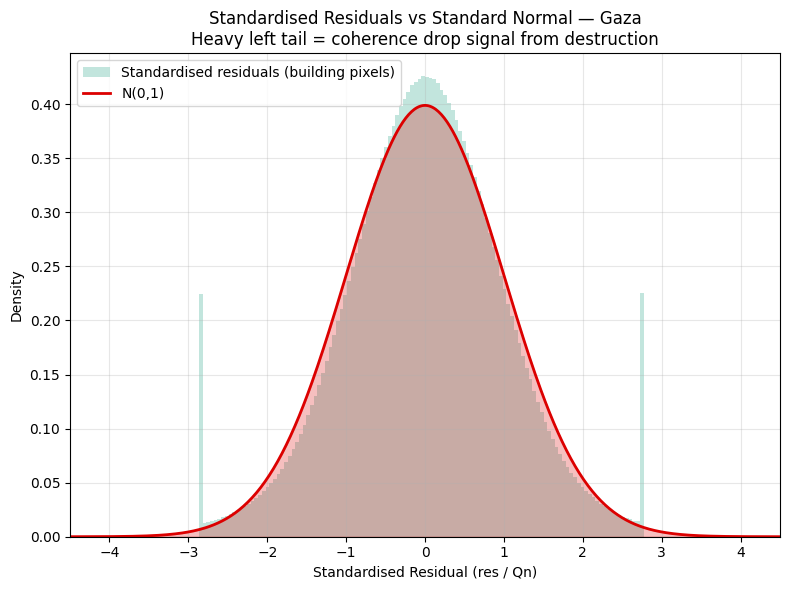

In [23]:
#  Standardised residual density vs Standard Normal 
if 'res' in relevant_coherence_df.columns and 'qn_sd_py' in relevant_coherence_df.columns:
    std_res_col = 'std_res'
    relevant_coherence_df[std_res_col] = (
        relevant_coherence_df['res'] / relevant_coherence_df['qn_sd_py']
    )
    sr = relevant_coherence_df.loc[
        relevant_coherence_df['weight'].notna(), std_res_col
    ].dropna()
    q01, q99 = sr.quantile(0.01), sr.quantile(0.99)
    sr_clip = sr.clip(q01, q99)

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.hist(sr_clip, bins=120, density=True, alpha=0.55, color='#91D1C2',
            label='Standardised residuals (building pixels)')
    xs = np.linspace(-4.5, 4.5, 500)
    ax.fill_between(xs, 0, norm.pdf(xs), alpha=0.25, color='#DC0000')
    ax.plot(xs, norm.pdf(xs), color='#DC0000', lw=2, label='N(0,1)')
    ax.set(xlabel='Standardised Residual (res / Qn)', ylabel='Density',
           title='Standardised Residuals vs Standard Normal — Gaza\n'
                 'Heavy left tail = coherence drop signal from destruction',
           xlim=(-4.5, 4.5))
    ax.legend(); ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig(OUTPUT_PATH / "figures" / "gaza_standardized_residuals.png", dpi=150)
    plt.show()

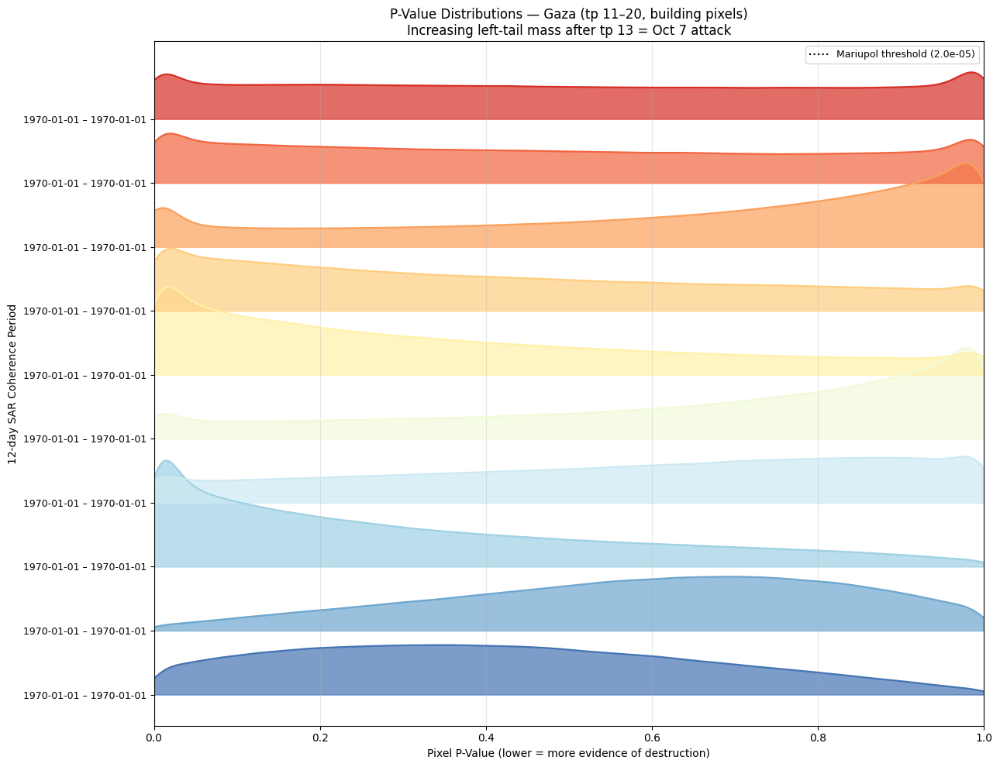

In [24]:
# P-value ridge density plot (Figure 4 equivalent, tps 11-20)
plot_tps = [tp for tp in range(11, 21) if tp in relevant_coherence_df['time_point'].values]
colors_r = plt.cm.RdYlBu_r(np.linspace(0.1, 0.9, len(plot_tps)))

fig, ax = plt.subplots(figsize=(13, 10))
y_pos, y_labs = [], []

for idx, tp in enumerate(plot_tps):
    sub = relevant_coherence_df[
        (relevant_coherence_df['time_point']==tp) &
        relevant_coherence_df['prob_res_qn'].notna()
    ]['prob_res_qn']
    if len(sub) < 5: continue
    xs = np.linspace(0, 1, 500)
    try:
        ys = gaussian_kde(sub, bw_method='scott')(xs) * 0.55 + idx
    except Exception: continue
    row  = dates_df[dates_df['time_point']==tp]
    lbl  = row['label'].values[0] if len(row) else str(tp)
    ax.fill_between(xs, idx, ys, alpha=0.7, color=colors_r[idx])
    ax.plot(xs, ys, color=colors_r[idx], lw=1.5)
    y_pos.append(idx); y_labs.append(lbl)

ax.axvline(MARIUPOL_THRESHOLD, color='black', ls=':', lw=1.5,
           label=f'Mariupol threshold ({MARIUPOL_THRESHOLD:.1e})')
ax.set_yticks(y_pos); ax.set_yticklabels(y_labs, fontsize=9)
ax.set(xlabel='Pixel P-Value (lower = more evidence of destruction)',
       ylabel='12-day SAR Coherence Period',
       title='P-Value Distributions — Gaza (tp 11–20, building pixels)\n'
             'Increasing left-tail mass after tp 13 = Oct 7 attack', xlim=(0,1))
ax.legend(fontsize=9); ax.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.savefig(OUTPUT_PATH / "figures" / "gaza_ridge_pvalue.png", dpi=150)
plt.show()

## Step 10 — Spatial P-Value Maps (Figure 4)

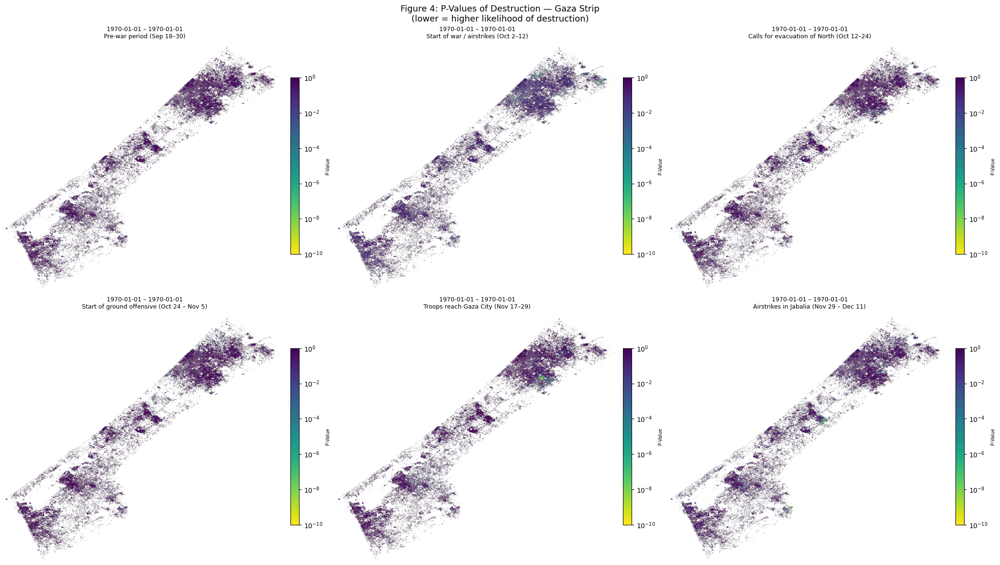

In [25]:
#  Figure 4: P-value maps for 6 selected time points
max_r = int(relevant_coherence_df['r'].max())
max_c = int(relevant_coherence_df['c'].max())
EPS   = 1e-10

fig4_tps = [12, 13, 14, 15, 18, 20]  
fig4_labels = [
    "Pre-war period (Sep 18–30)",
    "Start of war / airstrikes (Oct 2–12)",
    "Calls for evacuation of North (Oct 12–24)",
    "Start of ground offensive (Oct 24 – Nov 5)",
    "Troops reach Gaza City (Nov 17–29)",
    "Airstrikes in Jabalia (Nov 29 – Dec 11)",
]

fig, axes = plt.subplots(2, 3, figsize=(21, 12))

for ax, tp, lbl in zip(axes.flatten(), fig4_tps, fig4_labels):
    cur = relevant_coherence_df[relevant_coherence_df['time_point']==tp].dropna(subset=['prob_res_qn'])
    if cur.empty:
        ax.set_title(f'tp {tp} — no data'); ax.axis('off'); continue

    grid = np.full((max_r, max_c), np.nan)
    r_i = (cur['r'].astype(int).values - 1).clip(0, max_r-1)
    c_i = (cur['c'].astype(int).values - 1).clip(0, max_c-1)
    grid[r_i, c_i] = np.maximum(cur['prob_res_qn'].values, EPS)

    tp_label = dates_df.loc[dates_df['time_point']==tp,'label'].values
    tp_label = tp_label[0] if len(tp_label) else str(tp)

    im = ax.imshow(grid, cmap='viridis_r',
                   norm=mcolors.LogNorm(vmin=EPS, vmax=1.0),
                   aspect='auto', origin='upper')
    ax.set_title(f'{tp_label}\n{lbl}', fontsize=9)
    ax.axis('off')
    plt.colorbar(im, ax=ax, fraction=0.03, pad=0.02).set_label('P-Value', fontsize=7)

fig.suptitle('Figure 4: P-Values of Destruction — Gaza Strip\n'
             '(lower = higher likelihood of destruction)', fontsize=13)
plt.tight_layout()
plt.savefig(OUTPUT_PATH / "figures" / "gaza_fig4_pvalue_maps.png", dpi=150, bbox_inches='tight')
plt.show()

In [26]:
# Save all time-point p-value maps individually
os.makedirs(OUTPUT_PATH / "figures" / "pvalue_maps", exist_ok=True)

for tp in sorted(relevant_coherence_df['time_point'].unique()):
    cur = relevant_coherence_df[relevant_coherence_df['time_point']==tp].dropna(subset=['prob_res_qn'])
    if cur.empty: continue

    grid = np.full((max_r, max_c), np.nan)
    r_i = (cur['r'].astype(int).values - 1).clip(0, max_r-1)
    c_i = (cur['c'].astype(int).values - 1).clip(0, max_c-1)
    grid[r_i, c_i] = np.maximum(cur['prob_res_qn'].values, EPS)

    tp_label = dates_df.loc[dates_df['time_point']==tp,'label'].values
    tp_label = tp_label[0] if len(tp_label) else str(tp)

    fig2, ax2 = plt.subplots(figsize=(10, 14))
    im2 = ax2.imshow(grid, cmap='viridis_r',
                     norm=mcolors.LogNorm(vmin=EPS, vmax=1.0),
                     aspect='auto', origin='upper')
    plt.colorbar(im2, ax=ax2, fraction=0.025, pad=0.03).set_label('P-Value (log)', fontsize=9)
    ax2.set_title(f'P-Values — {tp_label}', fontsize=11)
    ax2.axis('off')
    plt.tight_layout()
    plt.savefig(OUTPUT_PATH / "figures" / "pvalue_maps" / f"tp_{int(tp):02d}.png",
                dpi=120, bbox_inches='tight')
    plt.close()

## Step 11 — Building Classification Maps

In [27]:
# Per-time-point building classification maps 
cmap_bin = mcolors.ListedColormap(['#7B2D8B','#F1A340'])
norm_bin = mcolors.BoundaryNorm([-0.5,0.5,1.5], cmap_bin.N)

pix_ov_agg = (
    pixel_alignment_df_overlaps
    .dropna(subset=['weight'])
    .groupby(['r','c','building_id'])
    .agg(weight=('weight','sum'))
    .reset_index()
)

os.makedirs(OUTPUT_PATH / "figures" / "classification_maps", exist_ok=True)

for tp in sorted(conflict['time_point'].unique()):
    cur_cls = conflict[conflict['time_point']==tp][['building_id','cum_outlier_building']]
    pix_cls = (
        pix_ov_agg.merge(cur_cls, on='building_id', how='left')
        .groupby(['r','c'])['cum_outlier_building'].max()
        .reset_index()
        .dropna()
    )
    grid = np.full((max_r, max_c), np.nan)
    r_i = (pix_cls['r'].astype(int).values - 1).clip(0, max_r-1)
    c_i = (pix_cls['c'].astype(int).values - 1).clip(0, max_c-1)
    grid[r_i, c_i] = pix_cls['cum_outlier_building'].values

    tp_label = dates_df.loc[dates_df['time_point']==tp,'label'].values
    tp_label = tp_label[0] if len(tp_label) else str(tp)

    fig3, ax3 = plt.subplots(figsize=(10, 14))
    ax3.imshow(grid, cmap=cmap_bin, norm=norm_bin, aspect='auto', origin='upper')
    patches = [mpatches.Patch(color='#7B2D8B', label='No Destruction'),
               mpatches.Patch(color='#F1A340', label='Destruction Detected')]
    ax3.legend(handles=patches, loc='upper right', fontsize=9)
    ax3.set_title(f'Building Classification — {tp_label}', fontsize=11)
    ax3.axis('off')
    plt.tight_layout()
    plt.savefig(OUTPUT_PATH / "figures" / "classification_maps" / f"tp_{int(tp):02d}.png",
                dpi=130, bbox_inches='tight')
    plt.close()

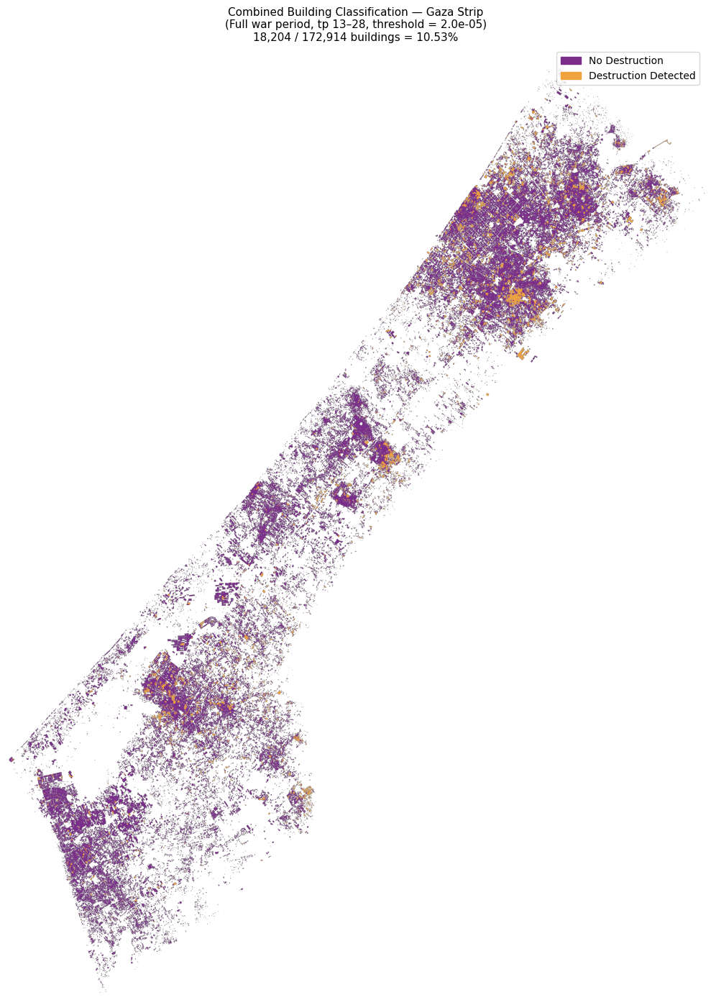

In [28]:
# Combined cumulative classification 
combined_cls = (
    conflict.groupby('building_id')['cum_outlier_building'].max().reset_index()
)
pix_combined = (
    pix_ov_agg.merge(combined_cls, on='building_id', how='left')
    .groupby(['r','c'])['cum_outlier_building'].max()
    .reset_index().dropna()
)
grid_comb = np.full((max_r, max_c), np.nan)
r_i = (pix_combined['r'].astype(int).values - 1).clip(0, max_r-1)
c_i = (pix_combined['c'].astype(int).values - 1).clip(0, max_c-1)
grid_comb[r_i, c_i] = pix_combined['cum_outlier_building'].values

fig4c, ax4c = plt.subplots(figsize=(10, 14))
ax4c.imshow(grid_comb, cmap=cmap_bin, norm=norm_bin, aspect='auto', origin='upper')
patches = [mpatches.Patch(color='#7B2D8B', label='No Destruction'),
           mpatches.Patch(color='#F1A340', label='Destruction Detected')]
ax4c.legend(handles=patches, loc='upper right', fontsize=10)
n_destroyed = int(combined_cls['cum_outlier_building'].sum())
n_total     = len(combined_cls)
ax4c.set_title(
    f'Combined Building Classification — Gaza Strip\n'
    f'(Full war period, tp 13–28, threshold = {MARIUPOL_THRESHOLD:.1e})\n'
    f'{n_destroyed:,} / {n_total:,} buildings = {100*n_destroyed/n_total:.2f}%',
    fontsize=11
)
ax4c.axis('off')
plt.tight_layout()
plt.savefig(OUTPUT_PATH / "figures" / "gaza_combined_classification.png", dpi=150, bbox_inches='tight')
plt.show()

## Step 12 — Spatial Validation (Supplementary Material 19)

In [29]:
UNOSAT_PERIODS = {
    1: {"our_tp": 13, "unosat_pct": 0.84,  "date": "2023-10-10"},
    2: {"our_tp": 15, "unosat_pct": 2.99,  "date": "2023-11-11"},
    3: {"our_tp": 18, "unosat_pct": 4.44,  "date": "2023-11-26"},
    4: {"our_tp": 20, "unosat_pct": 10.31, "date": "2024-01-07"},
    5: {"our_tp": 25, "unosat_pct": 14.25, "date": "2024-02-29"},
    6: {"our_tp": 28, "unosat_pct": 15.43, "date": "2024-04-01"},
}

print("SPATIAL VALIDATION — Table 2 expanded")
print("="*75)
header = f"{'Period':<7} {'UNOSAT date':<14} {'UNOSAT %':>10}  {'Our date':>22}  {'Our %':>7}  {'Diff':>7}"
print(header)
print("-"*75)

val_rows = []
for pid, info in UNOSAT_PERIODS.items():
    tp   = info['our_tp']
    upct = info['unosat_pct']
    row  = destruction_stats.loc[destruction_stats.index==tp]
    if len(row) == 0:
        print(f"{pid:<7} {info['date']:<14} {upct:>9.2f}%   tp {tp} not in data")
        continue
    our_pct  = float(row['percent'].values[0])
    our_lbl  = dates_df.loc[dates_df.time_point==tp,'label'].values
    our_lbl  = our_lbl[0][:22] if len(our_lbl) else str(tp)
    diff     = our_pct - upct
    val_rows.append({'period':pid,'unosat_date':info['date'],'unosat_pct':upct,
                     'our_tp':tp,'our_pct':our_pct,'diff':diff})
    print(f"{pid:<7} {info['date']:<14} {upct:>9.2f}%  {our_lbl:>22}  {our_pct:>6.2f}%  {diff:>+7.2f}%")

val_df = pd.DataFrame(val_rows)
val_df.to_csv(OUTPUT_PATH / "results" / "spatial_validation_table2.csv", index=False)

SPATIAL VALIDATION — Table 2 expanded
Period  UNOSAT date      UNOSAT %                Our date    Our %     Diff
---------------------------------------------------------------------------
1       2023-10-10          0.84%  1970-01-01 – 1970-01-0    1.54%    +0.70%
2       2023-11-11          2.99%  1970-01-01 – 1970-01-0    2.51%    -0.48%
3       2023-11-26          4.44%  1970-01-01 – 1970-01-0    5.70%    +1.26%
4       2024-01-07         10.31%  1970-01-01 – 1970-01-0    7.75%    -2.56%
5       2024-02-29         14.25%  1970-01-01 – 1970-01-0   10.12%    -4.13%
6       2024-04-01         15.43%  1970-01-01 – 1970-01-0   10.53%    -4.90%


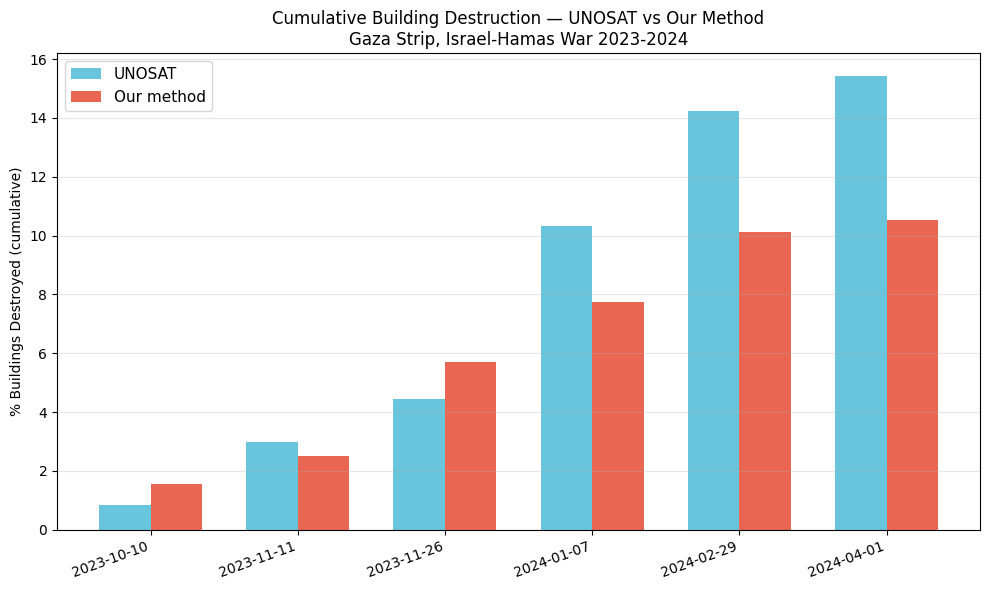

In [30]:
# Validation bar chart 
fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(val_df))
w = 0.35
ax.bar(x - w/2, val_df['unosat_pct'], w, label='UNOSAT', color='#4DBBD5', alpha=0.85)
ax.bar(x + w/2, val_df['our_pct'],    w, label='Our method', color='#E64B35', alpha=0.85)
ax.set_xticks(x)
ax.set_xticklabels(val_df['unosat_date'], rotation=20, ha='right')
ax.set_ylabel('% Buildings Destroyed (cumulative)')
ax.set_title('Cumulative Building Destruction — UNOSAT vs Our Method\n'
             'Gaza Strip, Israel-Hamas War 2023-2024')
ax.legend(fontsize=11)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(OUTPUT_PATH / "figures" / "gaza_validation_bar.png", dpi=150)
plt.show()

## Step 13 — P-Value Trends Over Time

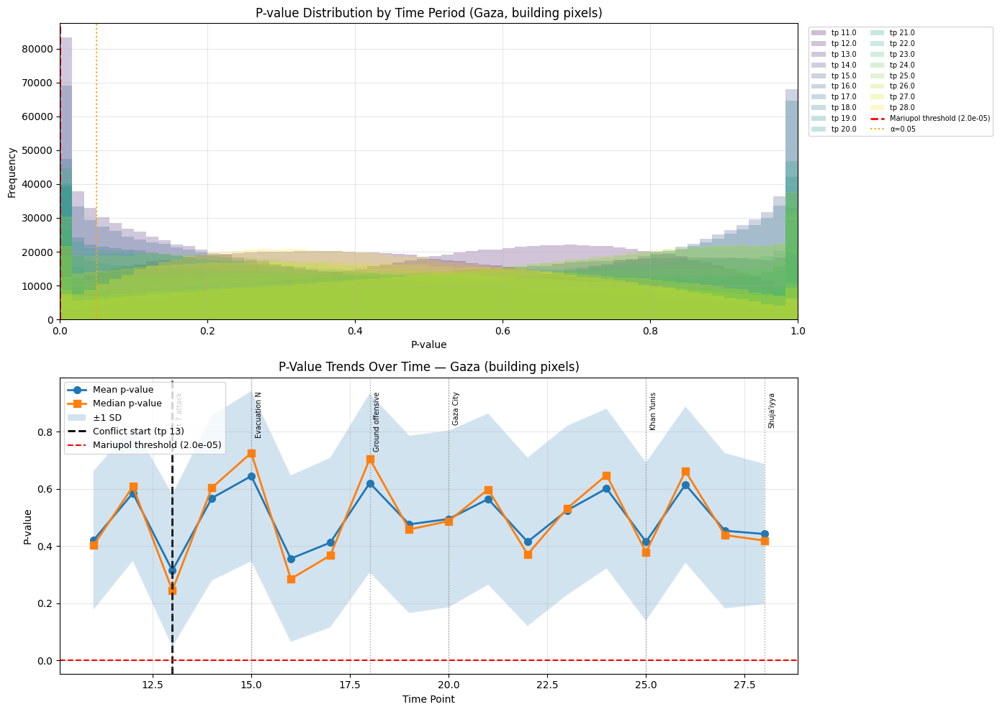

In [31]:
#  Mean/median p-value trend 
plot_df = relevant_coherence_df[
    (relevant_coherence_df['time_point'] >= 11) &
    (relevant_coherence_df['time_point'] <= 28) &
    relevant_coherence_df['prob_res_qn'].notna()
].copy()

p_by_time = plot_df.groupby('time_point')['prob_res_qn'].agg(['mean','median','std'])

fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# Panel 1: histogram by tp
tps = sorted(plot_df['time_point'].unique())
cols = plt.cm.viridis(np.linspace(0,1,len(tps)))
for idx, tp in enumerate(tps):
    d = plot_df[plot_df['time_point']==tp]['prob_res_qn']
    axes[0].hist(d, bins=60, alpha=0.25, color=cols[idx], label=f'tp {tp}')
axes[0].axvline(MARIUPOL_THRESHOLD, color='red', ls='--', lw=2,
                label=f'Mariupol threshold ({MARIUPOL_THRESHOLD:.1e})')
axes[0].axvline(0.05, color='orange', ls=':', lw=1.5, label='α=0.05')
axes[0].set(xlabel='P-value', ylabel='Frequency',
            title='P-value Distribution by Time Period (Gaza, building pixels)', xlim=(0,1))
axes[0].legend(bbox_to_anchor=(1.01,1), loc='upper left', fontsize=7, ncol=2)
axes[0].grid(alpha=0.3)

# Panel 2: trend
axes[1].plot(p_by_time.index, p_by_time['mean'],   marker='o', lw=2, ms=7, label='Mean p-value')
axes[1].plot(p_by_time.index, p_by_time['median'], marker='s', lw=2, ms=7, label='Median p-value')
axes[1].fill_between(p_by_time.index,
                     (p_by_time['mean']-p_by_time['std']).clip(0,1),
                     (p_by_time['mean']+p_by_time['std']).clip(0,1),
                     alpha=0.2, label='±1 SD')
axes[1].axvline(CONFLICT_START_TIMEPOINT, color='black', ls='--', lw=2,
                label=f'Conflict start (tp {CONFLICT_START_TIMEPOINT})')
axes[1].axhline(MARIUPOL_THRESHOLD, color='red', ls='--', lw=1.5,
                label=f'Mariupol threshold ({MARIUPOL_THRESHOLD:.1e})')

# Add key event annotations
key_events = {13:"Oct 7 attack",15:"Evacuation N",18:"Ground offensive",20:"Gaza City",
              25:"Khan Yunis",28:"Shuja'iyya"}
for tp_ev, ev_lbl in key_events.items():
    if tp_ev in p_by_time.index:
        axes[1].axvline(tp_ev, color='grey', ls=':', lw=1, alpha=0.7)
        axes[1].text(tp_ev+0.1, axes[1].get_ylim()[1]*0.95, ev_lbl, fontsize=7, rotation=90, va='top')

axes[1].set(xlabel='Time Point', ylabel='P-value',
            title='P-Value Trends Over Time — Gaza (building pixels)')
axes[1].legend(fontsize=9); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(OUTPUT_PATH / "figures" / "gaza_pvalue_trends.png", dpi=150, bbox_inches='tight')
plt.show()

## Step 14 — Satellite Overlay Visualization (from original script)

  Image CRS: EPSG:32636  | Bounds: BoundingBox(left=615192.386822, bottom=3454532.149963, right=650121.321713, top=3496678.717876)
  Destroyed buildings at tp 28: 18,204


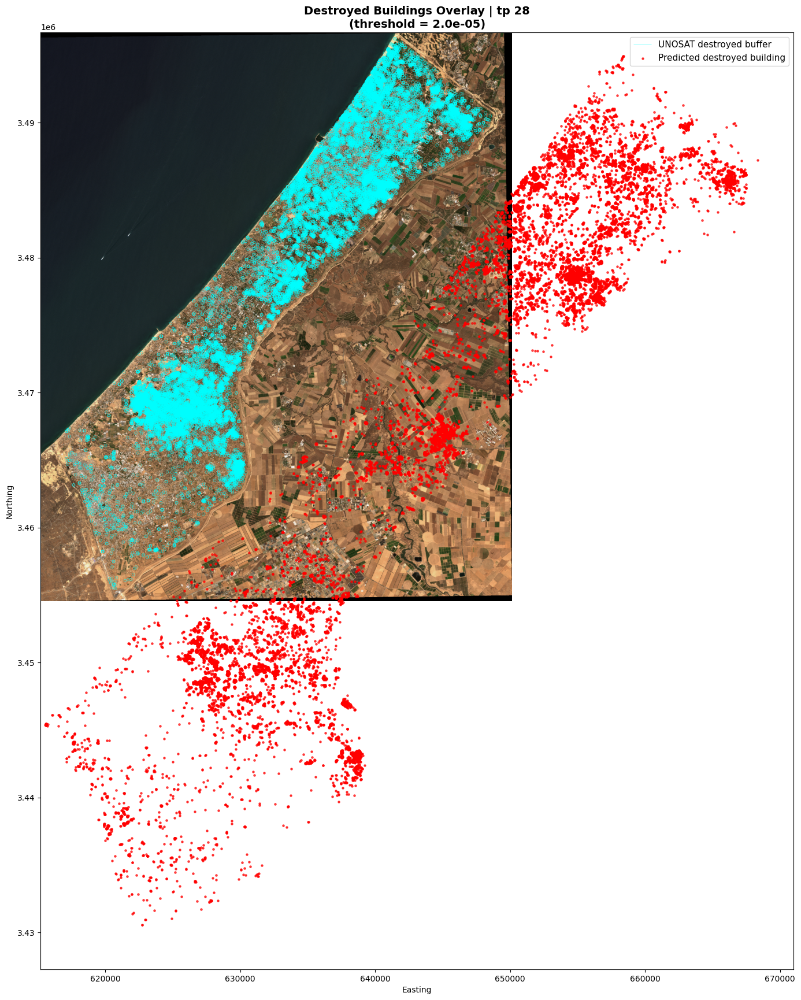

In [32]:
TIMEPOINT_TO_SHOW = 28
BUFFER_RADIUS = 100
MAX_POINTS_TO_PLOT = 50000

with rasterio.open(BACKGROUND_IMAGE_PATH) as src:
    img_crs = src.crs
    bounds  = src.bounds
    img     = src.read([1,2,3]).transpose(1,2,0) if src.count >= 3 else               np.dstack([src.read(1)]*3)

img = img.astype("float32")
img = (img - np.nanmin(img)) / (np.nanmax(img) - np.nanmin(img) + 1e-9)
print(f"  Image CRS: {img_crs}  | Bounds: {bounds}")

pred_tp = conflict[conflict["time_point"]==TIMEPOINT_TO_SHOW].copy()
destroyed_ids = pred_tp.loc[pred_tp["cum_outlier_building"]==1,"building_id"].unique()
print(f"  Destroyed buildings at tp {TIMEPOINT_TO_SHOW}: {len(destroyed_ids):,}")

pix = pixel_alignment_df_overlaps[pixel_alignment_df_overlaps["building_id"].isin(destroyed_ids)].copy()
centers = pix.groupby("building_id")[["r","c"]].mean().reset_index()

with rasterio.open(BACKGROUND_IMAGE_PATH) as src:
    xs, ys = rasterio.transform.xy(
        src.transform,
        centers["r"].astype(int).values,
        centers["c"].astype(int).values,
        offset="center"
    )
centers["x"], centers["y"] = xs, ys
pred_points = gpd.GeoDataFrame(
    centers, geometry=gpd.points_from_xy(centers["x"], centers["y"]), crs=img_crs
)
if len(pred_points) > MAX_POINTS_TO_PLOT:
    pred_points = pred_points.sample(MAX_POINTS_TO_PLOT, random_state=42)

buffer_gdf = buffer_gdfs[BUFFER_RADIUS].copy()
destroy_cols_b = [c for c in buffer_gdf.columns if str(c).startswith("destroyed_")]
gt_col = "destroyed_6" if "destroyed_6" in buffer_gdf.columns else (
         sorted(destroy_cols_b)[-1] if destroy_cols_b else None)
unosat_ov = buffer_gdf[buffer_gdf[gt_col]==1] if gt_col else buffer_gdf
if unosat_ov.crs != img_crs:
    unosat_ov = unosat_ov.to_crs(img_crs)

fig, ax = plt.subplots(figsize=(14, 18))
ax.imshow(img, extent=[bounds.left,bounds.right,bounds.bottom,bounds.top])
if len(unosat_ov):
    unosat_ov.boundary.plot(ax=ax, lw=0.5, edgecolor='cyan', alpha=0.6,
                             label='UNOSAT destroyed buffer')
pred_points.plot(ax=ax, markersize=5, color='red', alpha=0.7,
                 label='Predicted destroyed building')
ax.set_title(f"Destroyed Buildings Overlay | tp {TIMEPOINT_TO_SHOW}\n"
             f"(threshold = {MARIUPOL_THRESHOLD:.1e})", fontsize=14, fontweight='bold')
ax.legend(loc='upper right', fontsize=11)
ax.set_xlabel("Easting"); ax.set_ylabel("Northing")
plt.tight_layout()
plt.savefig(OUTPUT_PATH / "figures" / f"overlay_tp_{TIMEPOINT_TO_SHOW}.png",
            dpi=200, bbox_inches='tight')
plt.show()

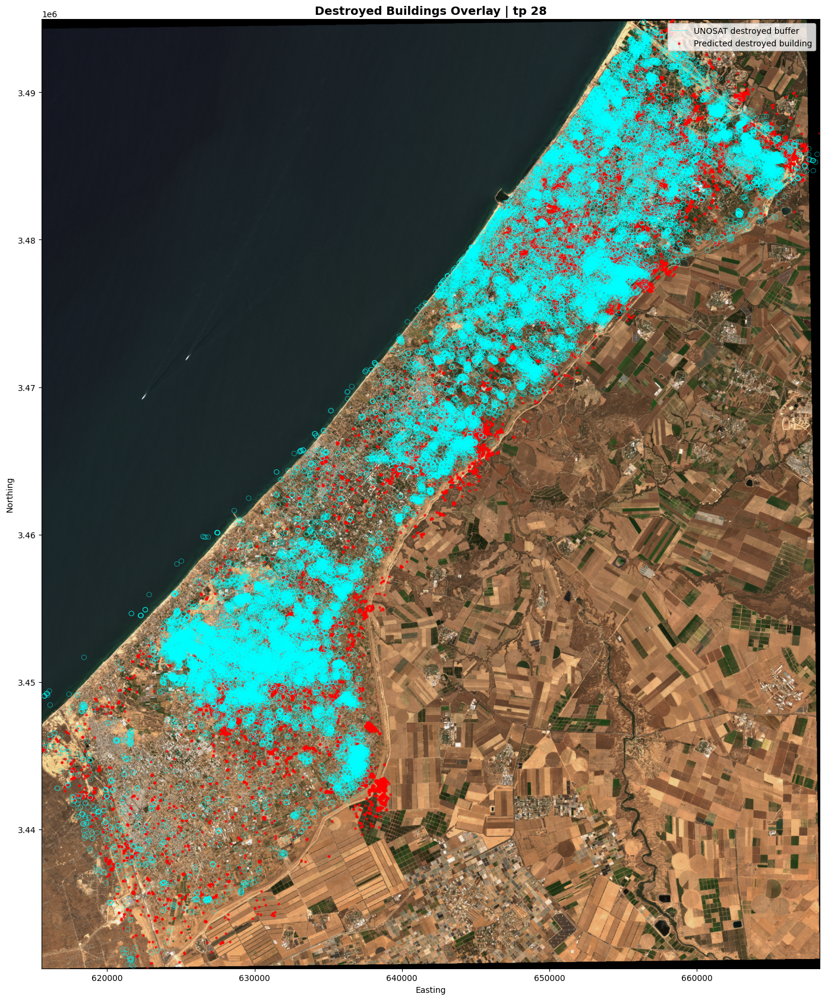

In [33]:
import matplotlib.pyplot as plt
from shapely.affinity import scale, translate

rxmin, rymin, rxmax, rymax = pred_points.total_bounds
uxmin, uymin, uxmax, uymax = unosat_ov.total_bounds

# scale factors (blue -> red)
sx = (rxmax - rxmin) / (uxmax - uxmin)
sy = (rymax - rymin) / (uymax - uymin)

unosat_fix = unosat_ov.copy()

unosat_fix["geometry"] = unosat_fix["geometry"].apply(
    lambda g: translate(
        scale(
            g,
            xfact=sx,
            yfact=sy,
            origin=(uxmin, uymin)
        ),
        xoff=rxmin - uxmin,
        yoff=rymin - uymin
    )
)

fig, ax = plt.subplots(figsize=(14,18))

# stretch image to red extent
ax.imshow(
    img,
    extent=[rxmin, rxmax, rymin, rymax],
    origin="upper"
)

# transformed blue
unosat_fix.boundary.plot(
    ax=ax,
    lw=0.5,
    edgecolor="cyan",
    alpha=0.7,
    label="UNOSAT destroyed buffer"
)

# red predictions
pred_points.plot(
    ax=ax,
    markersize=5,
    color="red",
    alpha=0.7,
    label="Predicted destroyed building"
)

ax.set_xlim(rxmin, rxmax)
ax.set_ylim(rymin, rymax)

ax.set_title(
    f"Destroyed Buildings Overlay | tp {TIMEPOINT_TO_SHOW}",
    fontsize=14,
    fontweight="bold"
)

ax.legend(loc="upper right")
ax.set_xlabel("Easting")
ax.set_ylabel("Northing")

plt.tight_layout()
plt.show()

In [34]:
print("\n" + "="*70)
print("FINAL SUMMARY — GAZA DESTRUCTION DETECTION")
print("="*70)
print(f"Method: SAR Coherence + Qn robust SD + HMP (lambda={LAMBDA_SMOOTH})")
print(f"Paper:  Racek et al. (2025), PNAS Nexus, Table 2 + Supplementary 19")
print()
print(f"{'Metric':<35} {'Result':>12}  {'Paper ref':>12}")
print("-"*65)
print(f"{'Total buildings analysed':<35} {our_total_bldgs:>12,}  {'172,916':>12}")
print(f"{'Conflict start time point':<35} {CONFLICT_START_TIMEPOINT:>12}  {'13':>12}")
print(f"{'Threshold (Mariupol optimal)':<35} {MARIUPOL_THRESHOLD:>12.3e}")
print(f"{'Pre-war FP rate (mean %)':<35} {prewar_fps.mean():>12.4f}%  {'0.021%':>12}")
print(f"{'Pre-war FP rate (SD %)':<35} {prewar_fps.std():>12.4f}%  {'0.010%':>12}")
print(f"{'Building AUPRC':<35} {pr_auc:>12.3f}")
print(f"{'Building AUROC':<35} {roc_auc:>12.3f}")
print(f"{'Best building F1':<35} {best_row['f1_mean']:>12.3f}")
print()
print("Table 2 — Cumulative % destroyed (UNOSAT vs Ours):")
for _, vr in val_df.iterrows():
    print(f"  {vr['unosat_date']}: UNOSAT={vr['unosat_pct']:5.2f}%  Ours={vr['our_pct']:5.2f}%"
          f"  Diff={vr['diff']:+5.2f}%")
print("="*70)
print(f"All outputs saved to: {OUTPUT_PATH}")


FINAL SUMMARY — GAZA DESTRUCTION DETECTION
Method: SAR Coherence + Qn robust SD + HMP (lambda=10)
Paper:  Racek et al. (2025), PNAS Nexus, Table 2 + Supplementary 19

Metric                                    Result     Paper ref
-----------------------------------------------------------------
Total buildings analysed                 172,914       172,916
Conflict start time point                     13            13
Threshold (Mariupol optimal)           2.000e-05
Pre-war FP rate (mean %)                  0.0207%        0.021%
Pre-war FP rate (SD %)                    0.0101%        0.010%
Building AUPRC                             0.920
Building AUROC                             0.930
Best building F1                           0.866

Table 2 — Cumulative % destroyed (UNOSAT vs Ours):
  2023-10-10: UNOSAT= 0.84%  Ours= 1.54%  Diff=+0.70%
  2023-11-11: UNOSAT= 2.99%  Ours= 2.51%  Diff=-0.48%
  2023-11-26: UNOSAT= 4.44%  Ours= 5.70%  Diff=+1.26%
  2024-01-07: UNOSAT=10.31%  Ours= 7.75